This is not a part of the paper but just analyzing the output from the NCOM model to see if it can represent the forntal eddy when compared to GOES SST

In [1]:
import xarray as xr
import hvplot.xarray
import cartopy.crs as crs

In [2]:
start_times = ['2021-09-5 13:00:00', '2021-09-5 18:15:00', '2021-09-6 1:00:00', '2021-09-6 5:10:00', '2021-09-6 12:30:00', '2021-09-6 16:45:00', '2021-09-7 2:55:00', '2021-09-7 6:45:00', '2021-09-7 12:10:00']
end_times = ['2021-09-5 17:30:00','2021-09-5 20:30:00', '2021-09-6 4:00:00', '2021-09-6 6:45:00', '2021-09-6 15:00:00', '2021-09-6 19:20:00', '2021-09-7 5:35:00', '2021-09-7 9:00:00', '2021-09-7 15:30:00']


Pull in OLCI data

Data downloaded from https://coda.eumetsat.int/#/home

scene id = S3A_OL_2_WFR____20210906T145640_20210906T145940_20210908T015642_0179_076_082_2340_MAR_O_NT_003

In [3]:
! pwd

/home/jovyan/Code/gs_front_analysis


In [6]:
#open dataset in xarray
nc_chl = xr.open_dataset('../sat_ocean_color/olci/chl_oc4me_haifa_2.nc') #path to chlorophyll file 

n_coord =xr.open_dataset('../sat_ocean_color/olci/geo_coordinates_haifa_2.nc') #path to coordinates file

#n_time = xr.open_dataset(str(nc_folder['path'])+ '/' + 'time_coordinates.nc') #path to time file

ds_grid = [[nc_chl], [n_coord]]

combined = xr.combine_nested(ds_grid, concat_dim=[None, None]) 
combined #dataset with all but not recognizing coordinates

olci_ds = combined.rename({'latitude': 'lat', 'longitude': 'lon'}).set_coords(['lon', 'lat']) #dataset recognizing coordinates as coordinates
# this chla product is log transformed
olci_ds['chl_norm'] = 10**olci_ds.CHL_OC4ME
olci_ds 

<xarray.Dataset>
Dimensions:        (columns: 4865, rows: 4091)
Coordinates:
    lat            (rows, columns) float64 ...
    lon            (rows, columns) float64 ...
Dimensions without coordinates: columns, rows
Data variables:
    CHL_OC4ME      (rows, columns) float32 nan nan nan nan ... nan nan nan nan
    CHL_OC4ME_err  (rows, columns) float32 ...
    altitude       (rows, columns) float32 ...
    chl_norm       (rows, columns) float32 nan nan nan nan ... nan nan nan nan

In [23]:
import matplotlib 

matplotlib.rcParams.update({'font.size': 12})

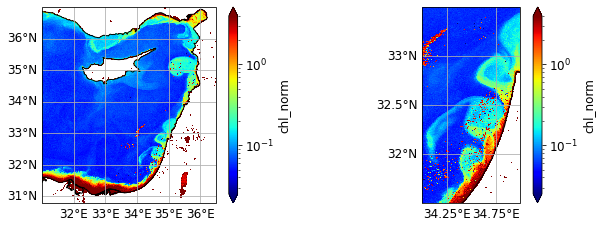

In [26]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import matplotlib.ticker as mticker

fig, ax = plt.subplots(1,2,figsize=(10,4), subplot_kw=dict(projection=crs.PlateCarree()))
ax[0].coastlines(resolution='10m')
ax[0].set_ylim(30.8,37)
ax[0].set_xlim(31,36.5)
olci_ds.chl_norm.plot(ax=ax[0],x='lon', y='lat', norm=LogNorm(vmin=0.025, vmax=4), cmap='jet')
gl = ax[0].gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
gl.xlocator = mticker.FixedLocator([32,33,34,35,36])
gl.ylocator = mticker.FixedLocator([31,32,33,34,35,36])
fig.autofmt_xdate(rotation=45)


ax[1].coastlines(resolution='10m')
ax[1].set_ylim(31.5,33.5)
ax[1].set_xlim(34,35)
olci_ds.chl_norm.plot(ax=ax[1],x='lon', y='lat', norm=LogNorm(vmin=0.025, vmax=4), cmap='jet')
gl = ax[1].gridlines(draw_labels=True)
gl.top_labels = False
gl.right_labels = False
gl.xlocator = mticker.FixedLocator([34.25,34.75])
gl.ylocator = mticker.FixedLocator([32,32.5,33])
fig.autofmt_xdate(rotation=45)


plt.savefig('haifa_olci_chla.png',dpi=600)
# fig.tight_layout()
plt.show()

In [15]:
#open dataset in xarray
nc_chl = xr.open_dataset('data/olci/chl_oc4me_20210906T145640.nc') #path to chlorophyll file 

n_coord =xr.open_dataset('data/olci/geo_coordinates_20210906T145640.nc') #path to coordinates file

#n_time = xr.open_dataset(str(nc_folder['path'])+ '/' + 'time_coordinates.nc') #path to time file

ds_grid = [[nc_chl], [n_coord]]

combined = xr.combine_nested(ds_grid, concat_dim=[None, None]) 
combined #dataset with all but not recognizing coordinates

olci_ds = combined.rename({'latitude': 'lat', 'longitude': 'lon'}).set_coords(['lon', 'lat']) #dataset recognizing coordinates as coordinates
# this chla product is log transformed
olci_ds['chl_norm'] = 10**olci_ds.CHL_OC4ME
olci_ds 

<xarray.Dataset>
Dimensions:        (columns: 4865, rows: 4091)
Coordinates:
    lat            (rows, columns) float64 ...
    lon            (rows, columns) float64 ...
Dimensions without coordinates: columns, rows
Data variables:
    CHL_OC4ME      (rows, columns) float32 nan nan nan nan ... nan nan nan nan
    CHL_OC4ME_err  (rows, columns) float32 ...
    altitude       (rows, columns) float32 ...
    chl_norm       (rows, columns) float32 nan nan nan nan ... nan nan nan nan

In [16]:
#open dataset in xarray
nc_chl = xr.open_dataset('data/olci/chl_oc4me_20210905T144335.nc') #path to chlorophyll file 

n_coord =xr.open_dataset('data/olci/geo_coordinates_20210905T144335.nc') #path to coordinates file

#n_time = xr.open_dataset(str(nc_folder['path'])+ '/' + 'time_coordinates.nc') #path to time file

ds_grid = [[nc_chl], [n_coord]]

combined = xr.combine_nested(ds_grid, concat_dim=[None, None]) 
combined #dataset with all but not recognizing coordinates

olci_ds_sept5 = combined.rename({'latitude': 'lat', 'longitude': 'lon'}).set_coords(['lon', 'lat']) #dataset recognizing coordinates as coordinates
# this chla product is log transformed
olci_ds_sept5['chl_norm'] = 10**olci_ds_sept5.CHL_OC4ME
olci_ds_sept5 

<xarray.Dataset>
Dimensions:        (columns: 4865, rows: 4090)
Coordinates:
    lat            (rows, columns) float64 ...
    lon            (rows, columns) float64 ...
Dimensions without coordinates: columns, rows
Data variables:
    CHL_OC4ME      (rows, columns) float32 nan nan nan nan ... nan nan nan nan
    CHL_OC4ME_err  (rows, columns) float32 ...
    altitude       (rows, columns) float32 ...
    chl_norm       (rows, columns) float32 nan nan nan nan ... nan nan nan nan

In [17]:
olci_ds_sept5 = olci_ds_sept5.sel( columns=slice(0,1000), rows=slice(2000,3000))

In [99]:
olci_ds_sept5.CHL_OC4ME.hvplot.quadmesh(
    'lon', 'lat', projection=crs.PlateCarree(), project=True,
    dynamic=True, 
    frame_height=600, clim=(-1.5,1.5), rasterize=True, cmap='jet') * df.loc['2021-09-5 11:00:00':'2021-09-7 13:45:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.2)

:DynamicMap   []
   :Overlay
      .Image.I  :Image   [lon,lat]   (CHL_OC4ME)
      .Points.I :Points   [lon,lat]

In [29]:
import cmocean

/srv/conda/envs/notebook/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,


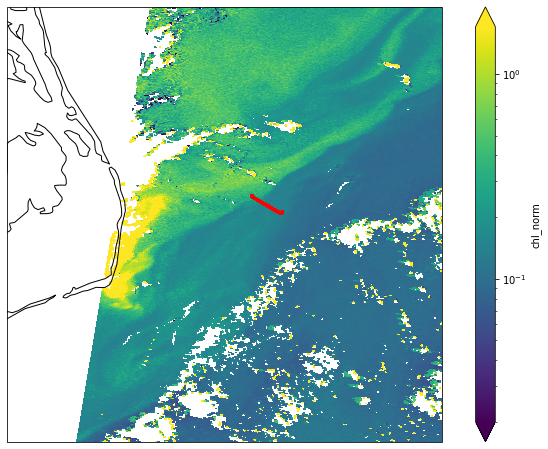

In [46]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

fig, ax = plt.subplots(1,1, figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
ax.set_ylim(34.52999878,36.50999832)
ax.set_xlim(-75.98999786,-74.01000214)
olci_ds_sept5.chl_norm.plot(ax=ax,x='lon', y='lat', norm=LogNorm(vmin=0.02, vmax=1.7), cmap='viridis')
df_subset.loc[start_times[0]:end_times[0]].plot(ax=ax, markersize=4, color='red', alpha=1)
fig.savefig('olci_chla_sept0515.png',dpi=400)
# ax[1].set_title(titles[i] + ' zoom')
# fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()

# fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
# plt.savefig('sampling_locations_sept4-9.png',dpi=300)
plt.show()

In [80]:
olci_ds.chl_norm[1000:1900,1800:3000].lon.max()

<xarray.DataArray 'lon' ()>
array(-69.426455)

In [81]:
olci_ds = olci_ds.sel( rows=slice(1800,3000), columns=slice(1000,1900))

In [82]:
olci_ds.CHL_OC4ME.hvplot.quadmesh(
    'lon', 'lat', projection=crs.PlateCarree(), project=True,
    dynamic=True, 
    frame_height=600, clim=(-1.5,1.5), rasterize=True, cmap='jet') * df.loc['2021-09-5 11:00:00':'2021-09-7 13:45:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.2)

:DynamicMap   []
   :Overlay
      .Image.I  :Image   [lon,lat]   (CHL_OC4ME)
      .Points.I :Points   [lon,lat]

/srv/conda/envs/notebook/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,


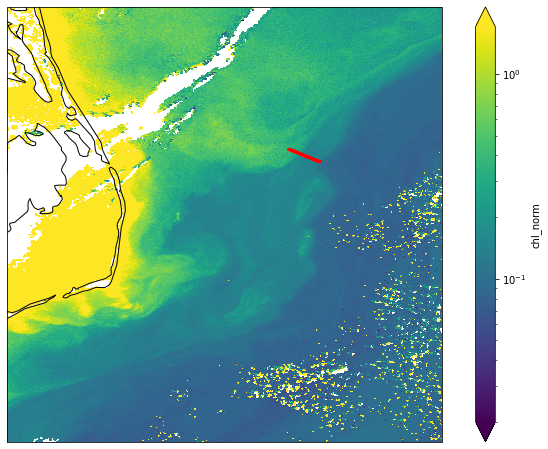

In [45]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

fig, ax = plt.subplots(1,1, figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
ax.set_ylim(34.52999878,36.50999832)
ax.set_xlim(-75.98999786,-74.01000214)
olci_ds.chl_norm.plot(ax=ax,x='lon', y='lat', norm=LogNorm(vmin=0.02, vmax=1.7), cmap='viridis')
df_subset.loc[start_times[4]:end_times[4]].plot(ax=ax, markersize=4, color='red', alpha=1)
fig.savefig('olci_chla_sept0614.png',dpi=400)
# ax[1].set_title(titles[i] + ' zoom')
# fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()

# fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
# plt.savefig('sampling_locations_sept4-9.png',dpi=300)
plt.show()

/srv/conda/envs/notebook/lib/python3.8/site-packages/cartopy/mpl/geoaxes.py:1597: UserWarning: The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.
  X, Y, C, shading = self._pcolorargs('pcolormesh', *args,


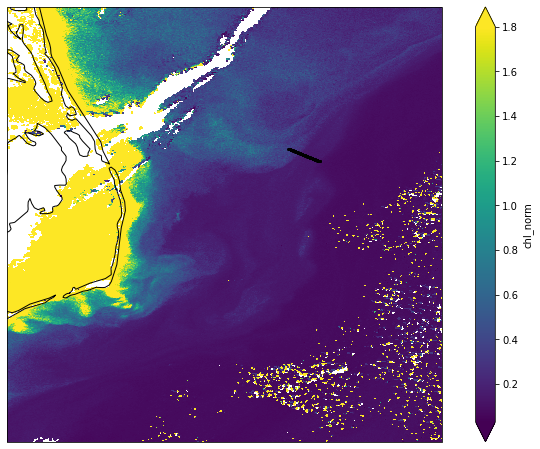

In [36]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

fig, ax = plt.subplots(1,1, figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
ax.set_ylim(34.52999878,36.50999832)
ax.set_xlim(-75.98999786,-74.01000214)
olci_ds.chl_norm.plot(ax=ax,x='lon', y='lat', norm=LogNorm(vmin=0.03, vmax=1.8), cmap='viridis')
df_subset.loc[start_times[4]:end_times[4]].plot(ax=ax, markersize=4, color='black', alpha=1)
# fig.savefig('olci_chla_sept0614.png',dpi=400)
# ax[1].set_title(titles[i] + ' zoom')
# fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()

# fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
# plt.savefig('sampling_locations_sept4-9.png',dpi=300)
plt.show()

Investigate CODAR data

In [218]:
ds_codar = xr.open_dataset('https://hfrnet-tds.ucsd.edu/thredds/dodsC/HFR/USEGC/6km/hourly/RTV/HFRADAR_US_East_and_Gulf_Coast_6km_Resolution_Hourly_RTV_best.ncd')

In [219]:
ds_codar

<xarray.Dataset>
Dimensions:                (lat: 460, lon: 701, nv: 2, time: 87654, time_1: 1)
Coordinates:
  * lat                    (lat) float32 21.74 21.79 21.84 ... 46.39 46.44 46.49
  * lon                    (lon) float32 -97.88 -97.83 -97.77 ... -57.29 -57.23
  * time                   (time) datetime64[ns] 2012-01-01 ... 2022-02-14T19...
    time_run               (time) datetime64[ns] ...
Dimensions without coordinates: nv, time_1
Data variables:
    time_bnds              (time_1, nv) int32 ...
    depth_bnds             (nv) float32 ...
    wgs84                  int8 ...
    processing_parameters  int8 ...
    radial_metadata        int8 ...
    depth                  float32 ...
    time_offset            (time) datetime64[ns] ...
    u                      (time, lat, lon) float32 ...
    v                      (time, lat, lon) float32 ...
    dopx                   (time, lat, lon) float32 ...
    dopy                   (time, lat, lon) float32 ...
    hdop                   (time, lat, lon) float32 ...
    number_of_sites        (time, lat, lon) float32 ...
    number_of_radials      (time, lat, lon) float32 ...
Attributes:
    Conventions:               CF-1.4, ACDD-1.3
    id:                        202202140300siohfruwlsrtvusegc6km
    date_created:              2022-02-14T04:53:58Z
    source:                    surface ocean velocity field from hf-radar
    program:                   Integrated Ocean Observing System (IOOS)
    title:                     Near-Real Time Surface Ocean Velocity, U.S. Ea...
    summary:                   Surface ocean velocities estimated from HF-Rad...
    instrument:                Earth Remote Sensing Instruments, Active Remot...
    keywords:                  Earth Science, Oceans, Sea Surface, Coastal Pr...
    geospatial_lat_min:        21.73596
    geospatial_lat_max:        46.49442
    geospatial_lon_min:        -97.88385
    geospatial_lon_max:        -57.23121
    processing_level:          Near real-time dataset with automated data acq...
    history:                   2022-02-14T03:54:10Z hfrnet rtvMergeData: Savi...
    references:                Terrill, E. et al., 2006. Data Management and ...
    institution:               Coastal Observing Research and Development Cen...
    creator_type:              group
    creator_name:              HFRNet Administrators
    creator_email:             hfrnet.administrators@sio.ucsd.edu
    creator_url:               http://cordc.ucsd.edu/projects/mapping/
    naming_authority:          edu.ucsd.cordc
    standard_name_vocabulary:  CF Standard Name Table, Version 51
    keywords_vocabulary:       Global Change Master Directory (GCMD) Keywords...
    instrument_vocabulary:     Global Change Master Directory (GCMD) Keywords...
    format_version:            1.1.00
    product_version:           2.0.00
    _CoordSysBuilder:          ucar.nc2.dataset.conv.CF1Convention
    cdm_data_type:             GRID
    featureType:               GRID
    location:                  Proto fmrc:HFRADAR_US_East_and_Gulf_Coast_6km_...

In [2]:
import pandas as pd
import hvplot.pandas  # noqa
from datetime import timedelta
from datetime import datetime
import numpy as np
df = pd.read_csv("data/sept_cruise/SW21011R_RFP/EventData/DataLogger/Data every 1 min_001.elg")

date_time_strs = df['Date'] + ' ' + df['Time']

df['datetime'] = [datetime.strptime(x, '%m/%d/%Y %H:%M:%S') for x in date_time_strs]
df['utc_dt'] = df['datetime']+ timedelta(minutes=4)
df  = df.set_index('utc_dt')
def dms2dd(degrees, minutes, seconds, direction):
    dd = degrees + minutes/60 + seconds/(60*60);
    if direction == 'W' or direction == 'S':
        dd *= -1
    return dd;

df['lon'] = dms2dd(pd.to_numeric(df['SW-GGA-Long'].astype(str).str[:2]).astype(float), pd.to_numeric(df['SW-GGA-Long'].astype(str).str[2:]),np.array(0), 'W')
df['lat'] = dms2dd(pd.to_numeric(df['SW-GGA-Lat'].astype(str).str[:2]).astype(float), pd.to_numeric(df['SW-GGA-Lat'].astype(str).str[2:]),np.array(0), 'E')

In [248]:
resamp_codar = ds_codar.u[time_step:time_step+1000,:,:].sel( lat=slice(34, 37), lon=slice(-77,-73)).resample(time='6H').mean()

In [255]:
resamp_codar_v = ds_codar.v[time_step:time_step+1000,:,:].sel( lat=slice(34, 37), lon=slice(-77,-73)).resample(time='6H').mean()

In [253]:
resamp_codar.hvplot.quadmesh(
    'lon', 'lat', projection=crs.PlateCarree(), project=True,
    dynamic=True, 
    frame_height=600, clim=(-1,1), cmap='bwr', rasterize=True) * df.loc['2021-09-5 11:00:00':'2021-09-7 13:45:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.01)

:DynamicMap   [time]
   :Overlay
      .Image.I  :Image   [lon,lat]   (u)
      .Points.I :Points   [lon,lat]

In [256]:
resamp_codar_v.hvplot.quadmesh(
    'lon', 'lat', projection=crs.PlateCarree(), project=True,
    dynamic=True, 
    frame_height=600, clim=(-1,1), cmap='bwr', rasterize=True) * df.loc['2021-09-5 11:00:00':'2021-09-7 13:45:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.01)

:DynamicMap   [time]
   :Overlay
      .Image.I  :Image   [lon,lat]   (v)
      .Points.I :Points   [lon,lat]

<xarray.DataArray 'time' ()>
array('2021-09-03T02:00:00.000000000', dtype='datetime64[ns]')
Coordinates:
    time      datetime64[ns] 2021-09-03T02:00:00
    time_run  datetime64[ns] 2021-09-03T02:00:00
Attributes:
    long_name:            Forecast time for ForecastModelRunCollection
    standard_name:        time
    _CoordinateAxisType:  Time


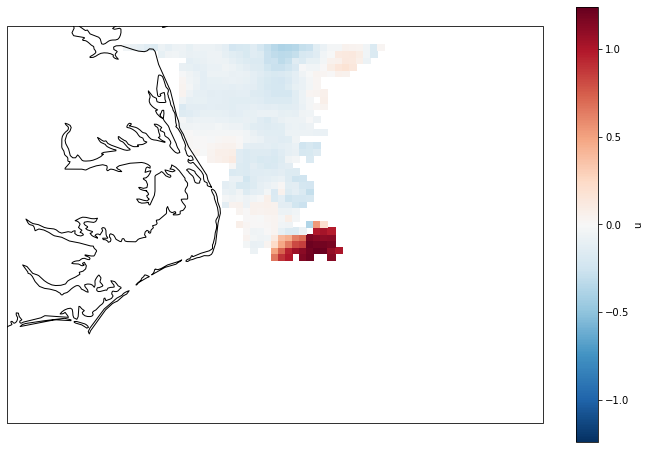

In [241]:
fig, ax = plt.subplots(1,1, figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
time_step = 83700
print(ds_codar.u[time_step].time)
ds_codar.u[time_step:time_step+12,:,:].sel( lat=slice(34, 37), lon=slice(-77,-73)).mean(dim='time', skipna=True).plot(ax=ax)

In [3]:
fn = 'https://www.ncei.noaa.gov/thredds-coastal/dodsC/us_east/us_east_20201218_to_current/20210906/coamps_ncom_useast_u_1_2021090600_00180000.nc'
# fn = 'https://www.ncei.noaa.gov/thredds-coastal/dodsC/us_east/us_east_20201218_to_current/20210903/coamps_ncom_useast_u_1_2021090300_00150000.nc'
# fn = 'https://www.ncei.noaa.gov/thredds-coastal/dodsC/us_east/us_east_20201218_to_current/20210820/coamps_ncom_useast_u_1_2021082000_00120000.nc'

ds = xr.open_dataset(fn)

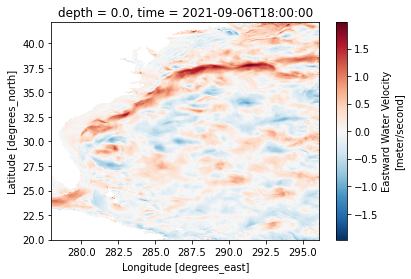

In [13]:
ds.water_u[0,0,:,:].plot()

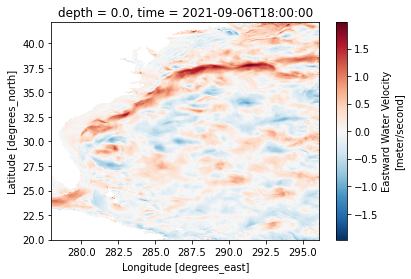

In [120]:
ds.water_u[0,0,:,:].plot()

In [121]:
ds

<xarray.Dataset>
Dimensions:                (depth: 40, lat: 664, lon: 544, time: 1)
Coordinates:
  * lon                    (lon) float64 278.0 278.0 278.1 ... 296.0 296.1 296.1
  * lat                    (lat) float64 20.0 20.03 20.07 ... 42.03 42.06 42.1
  * depth                  (depth) float64 0.0 2.0 4.0 6.0 ... 3e+03 4e+03 5e+03
  * time                   (time) datetime64[ns] 2021-09-06T18:00:00
Data variables:
    tau                    (time) datetime64[ns] ...
    surf_el                (time, lat, lon) float32 ...
    water_u                (time, depth, lat, lon) float32 ...
    water_v                (time, depth, lat, lon) float32 ...
    water_w                (time, depth, lat, lon) float32 ...
    salinity               (time, depth, lat, lon) float32 ...
    water_temp             (time, depth, lat, lon) float32 ...
    surf_atm_press         (time, lat, lon) float32 ...
    surf_wnd_stress_gridx  (time, lat, lon) float32 ...
    surf_wnd_stress_gridy  (time, lat, lon) float32 ...
    surf_roughness         (time, lat, lon) float32 ...
    surf_temp_flux         (time, lat, lon) float32 ...
    surf_solar_flux        (time, lat, lon) float32 ...
Attributes:
    classification_level:            
    distribution_statement:          Approved for public release; distributio...
    downgrade_date:                  not applicable
    classification_authority:        not applicable
    institution:                     not applicable
    Conventions:                     NAVO_netcdf_v1.1
    contact:                         not applicable
    history:                         created: 2021-09-06 07:39:50 -0000
    generating_model:                COAMPS useast_u project
    model_type:                      COAMPS Version 5.3.40
    operational_status:              not applicable
    input_data_source:               not applicable
    source:                          NCOM Version 4.3.42
    time_origin:                     2021-09-06 00:00:00 UTC
    DODS_EXTRA.Unlimited_Dimension:  time

In [122]:
ds.water_temp[0,30,:,:]

<xarray.DataArray 'water_temp' (lat: 664, lon: 544)>
[361216 values with dtype=float32]
Coordinates:
  * lon      (lon) float64 278.0 278.0 278.1 278.1 ... 296.0 296.0 296.1 296.1
  * lat      (lat) float64 20.0 20.03 20.07 20.1 20.13 ... 42.0 42.03 42.06 42.1
    depth    float64 800.0
    time     datetime64[ns] 2021-09-06T18:00:00
Attributes:
    long_name:     Water Temperature
    units:         degC
    NAVO_code:     15
    actual_range:  [ 2.167109 34.042572]
    valid_range:   [-32767  32767]

In [123]:
# ds.water_temp[0,0,:,:].hvplot.quadmesh(
#     'lon', 'lat', projection=crs.PlateCarree(), project=True,
#     dynamic=True, 
#     frame_height=600, clim=(25.5, 29.5), cmap='inferno', rasterize=True) #* df.loc['2021-08-27 11:00:00':'2021-08-29 13:45:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.01)

In [124]:
ds

<xarray.Dataset>
Dimensions:                (depth: 40, lat: 664, lon: 544, time: 1)
Coordinates:
  * lon                    (lon) float64 278.0 278.0 278.1 ... 296.0 296.1 296.1
  * lat                    (lat) float64 20.0 20.03 20.07 ... 42.03 42.06 42.1
  * depth                  (depth) float64 0.0 2.0 4.0 6.0 ... 3e+03 4e+03 5e+03
  * time                   (time) datetime64[ns] 2021-09-06T18:00:00
Data variables:
    tau                    (time) datetime64[ns] 2021-09-06T18:00:00
    surf_el                (time, lat, lon) float32 ...
    water_u                (time, depth, lat, lon) float32 ...
    water_v                (time, depth, lat, lon) float32 ...
    water_w                (time, depth, lat, lon) float32 ...
    salinity               (time, depth, lat, lon) float32 ...
    water_temp             (time, depth, lat, lon) float32 ...
    surf_atm_press         (time, lat, lon) float32 ...
    surf_wnd_stress_gridx  (time, lat, lon) float32 ...
    surf_wnd_stress_gridy  (time, lat, lon) float32 ...
    surf_roughness         (time, lat, lon) float32 ...
    surf_temp_flux         (time, lat, lon) float32 ...
    surf_solar_flux        (time, lat, lon) float32 ...
Attributes:
    classification_level:            
    distribution_statement:          Approved for public release; distributio...
    downgrade_date:                  not applicable
    classification_authority:        not applicable
    institution:                     not applicable
    Conventions:                     NAVO_netcdf_v1.1
    contact:                         not applicable
    history:                         created: 2021-09-06 07:39:50 -0000
    generating_model:                COAMPS useast_u project
    model_type:                      COAMPS Version 5.3.40
    operational_status:              not applicable
    input_data_source:               not applicable
    source:                          NCOM Version 4.3.42
    time_origin:                     2021-09-06 00:00:00 UTC
    DODS_EXTRA.Unlimited_Dimension:  time

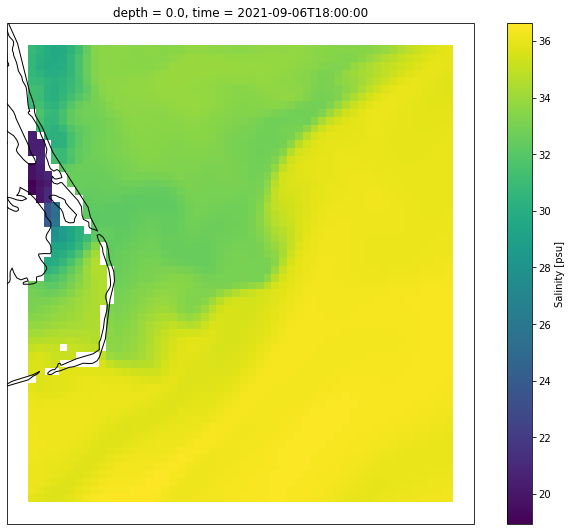

In [125]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1,1, figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
ds.salinity[0,0,440:498,186:240].plot(ax=ax)

# fig.savefig('sst_sept0619_studypoints.png',dpi=400)
# ax[1].set_title(titles[i] + ' zoom')
fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()

# fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
# plt.savefig('sampling_locations_sept4-9.png',dpi=300)
plt.show()

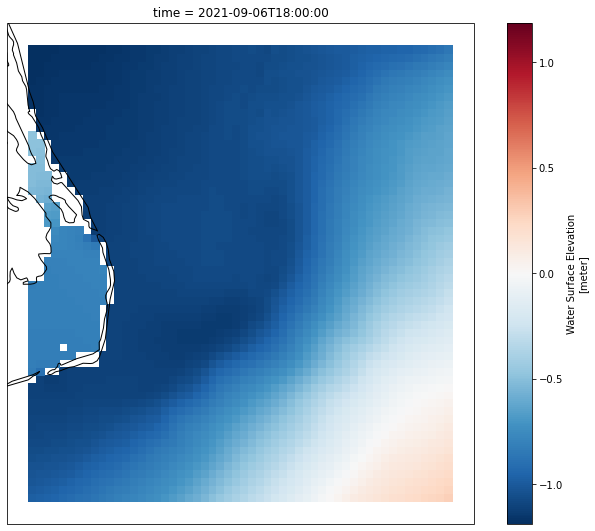

In [126]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1,1, figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
ds.surf_el[0,440:498,186:240].plot(ax=ax)

# fig.savefig('sst_sept0619_studypoints.png',dpi=400)
# ax[1].set_title(titles[i] + ' zoom')
fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()

# fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
# plt.savefig('sampling_locations_sept4-9.png',dpi=300)
plt.show()

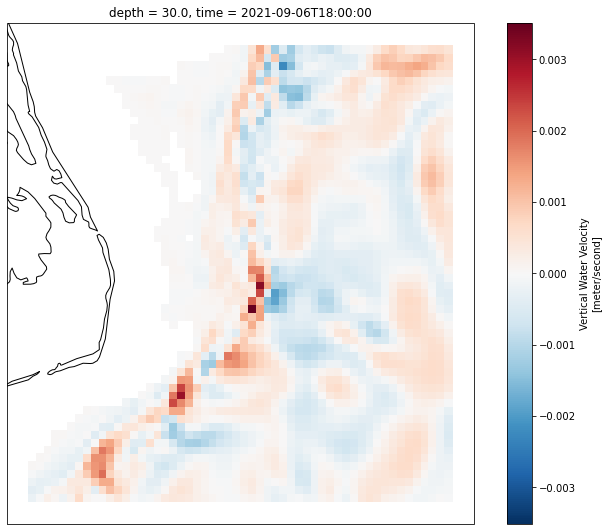

In [127]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1,1, figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
ds.water_w[0,10,440:498,186:240].plot(ax=ax)

# fig.savefig('sst_sept0619_studypoints.png',dpi=400)
# ax[1].set_title(titles[i] + ' zoom')
fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()

# fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
# plt.savefig('sampling_locations_sept4-9.png',dpi=300)
plt.show()

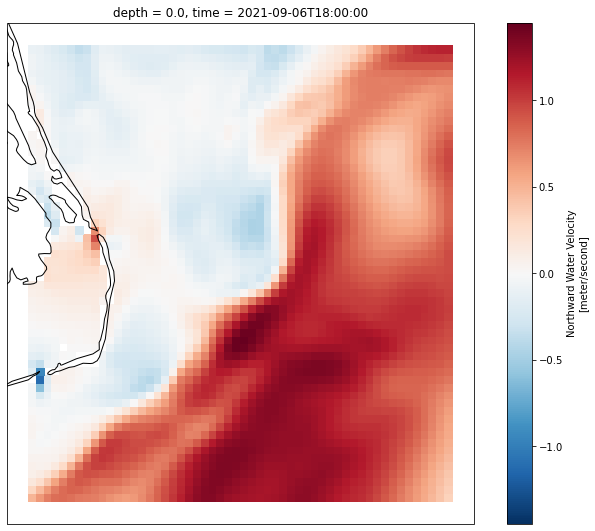

In [128]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1,1, figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
ds.water_v[0,0,440:498,186:240].plot(ax=ax)

# fig.savefig('sst_sept0619_studypoints.png',dpi=400)
# ax[1].set_title(titles[i] + ' zoom')
fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()

# fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
# plt.savefig('sampling_locations_sept4-9.png',dpi=300)
plt.show()

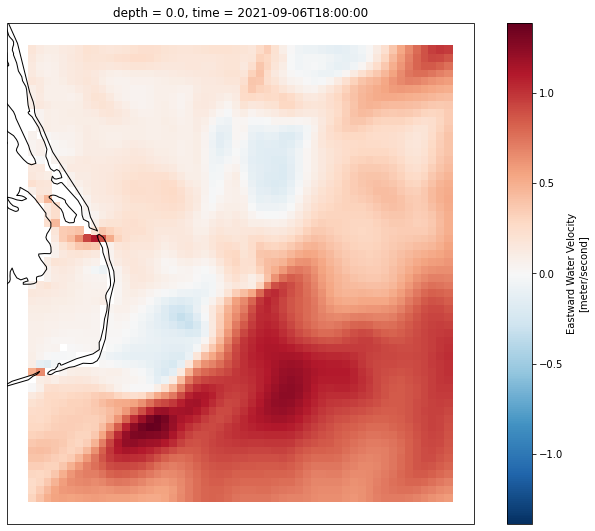

In [129]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1,1, figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
ds.water_u[0,0,440:498,186:240].plot(ax=ax)

# fig.savefig('sst_sept0619_studypoints.png',dpi=400)
# ax[1].set_title(titles[i] + ' zoom')
fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()

# fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
# plt.savefig('sampling_locations_sept4-9.png',dpi=300)
plt.show()

In [6]:
import geopandas as gpd

gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.lon, df.lat))

In [7]:
day_start_times = ['2021-09-5 13:00:00', '2021-09-5 18:15:00', '2021-09-6 12:30:00', '2021-09-6 16:45:00',  '2021-09-7 12:10:00']
day_end_times = ['2021-09-5 17:30:00','2021-09-5 20:30:00',  '2021-09-6 15:00:00', '2021-09-6 19:20:00', '2021-09-7 15:30:00']

dfs = []
for i in range(len(day_start_times)):
    dfs.append(gdf.loc[day_start_times[i]:day_end_times[i]])
df_subset = pd.concat(dfs)

In [28]:
ds

<xarray.Dataset>
Dimensions:                (depth: 40, lat: 664, lon: 544, time: 1)
Coordinates:
  * lon                    (lon) float64 278.0 278.0 278.1 ... 296.0 296.1 296.1
  * lat                    (lat) float64 20.0 20.03 20.07 ... 42.03 42.06 42.1
  * depth                  (depth) float64 0.0 2.0 4.0 6.0 ... 3e+03 4e+03 5e+03
  * time                   (time) datetime64[ns] 2021-09-06T18:00:00
Data variables:
    tau                    (time) datetime64[ns] ...
    surf_el                (time, lat, lon) float32 ...
    water_u                (time, depth, lat, lon) float32 ...
    water_v                (time, depth, lat, lon) float32 ...
    water_w                (time, depth, lat, lon) float32 ...
    salinity               (time, depth, lat, lon) float32 ...
    water_temp             (time, depth, lat, lon) float32 ...
    surf_atm_press         (time, lat, lon) float32 ...
    surf_wnd_stress_gridx  (time, lat, lon) float32 ...
    surf_wnd_stress_gridy  (time, lat, lon) float32 ...
    surf_roughness         (time, lat, lon) float32 ...
    surf_temp_flux         (time, lat, lon) float32 ...
    surf_solar_flux        (time, lat, lon) float32 ...
Attributes:
    classification_level:            
    distribution_statement:          Approved for public release; distributio...
    downgrade_date:                  not applicable
    classification_authority:        not applicable
    institution:                     not applicable
    Conventions:                     NAVO_netcdf_v1.1
    contact:                         not applicable
    history:                         created: 2021-09-06 07:39:50 -0000
    generating_model:                COAMPS useast_u project
    model_type:                      COAMPS Version 5.3.40
    operational_status:              not applicable
    input_data_source:               not applicable
    source:                          NCOM Version 4.3.42
    time_origin:                     2021-09-06 00:00:00 UTC
    DODS_EXTRA.Unlimited_Dimension:  time

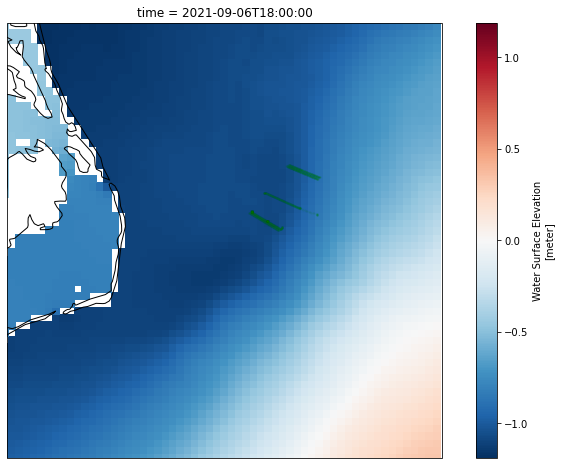

In [50]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1,1, figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
ax.set_ylim(34.52999878,36.50999832)
ax.set_xlim(-75.98999786,-74.01000214)
ds.surf_el[0,430:498,176:240].plot(ax=ax)
df_subset.loc['2021-09-5 11:00:00':'2021-09-7 15:30:00'].plot(ax=ax, markersize=2, color='green', alpha=.05)
# fig.savefig('ncom_sst_sept0618.png',dpi=400)
# ax[1].set_title(titles[i] + ' zoom')
# fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()

# fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
# plt.savefig('sampling_locations_sept4-9.png',dpi=300)
plt.show()

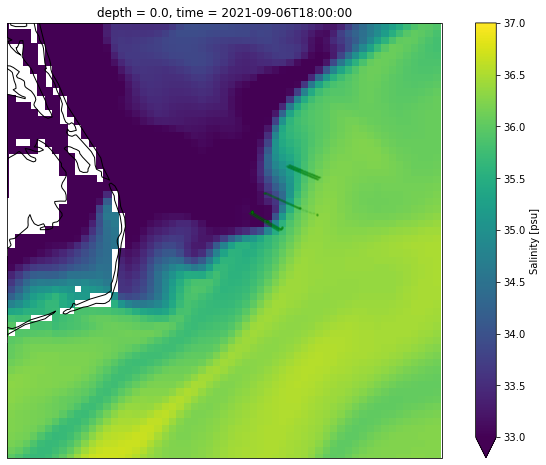

In [48]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1,1, figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
ax.set_ylim(34.52999878,36.50999832)
ax.set_xlim(-75.98999786,-74.01000214)
ds.salinity[0,0,430:498,176:240].plot(ax=ax,vmin=33,vmax=37)
df_subset.loc['2021-09-5 11:00:00':'2021-09-7 15:30:00'].plot(ax=ax, markersize=2, color='green', alpha=.05)
# fig.savefig('ncom_sst_sept0618.png',dpi=400)
# ax[1].set_title(titles[i] + ' zoom')
# fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()

# fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
# plt.savefig('sampling_locations_sept4-9.png',dpi=300)
plt.show()

In [47]:
import cmocean

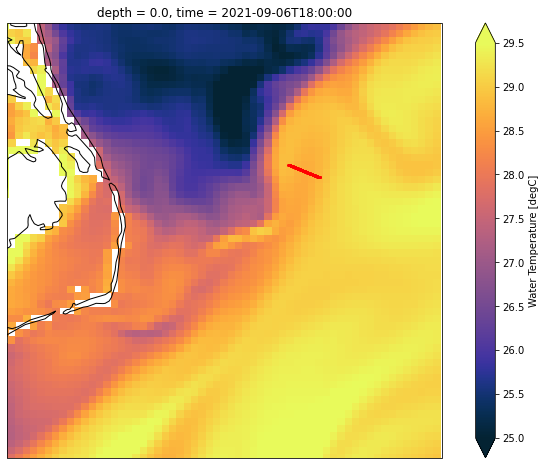

In [49]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1,1, figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
ax.set_ylim(34.52999878,36.50999832)
ax.set_xlim(-75.98999786,-74.01000214)
ds.water_temp[0,0,430:498,176:240].plot(ax=ax, vmin=25, vmax=29.5, cmap=cmocean.cm.thermal)
df_subset.loc['2021-09-6 12:30:00':'2021-09-6 15:00:00'].plot(ax=ax, markersize=4, color='red', alpha=1)
# gdf_subset.loc[start_times[0]:end_times[0]].plot(ax=ax, markersize=3, color='lime', alpha=.8)

fig.savefig('ncom_sst_sept0618.png',dpi=400)
# ax[1].set_title(titles[i] + ' zoom')
# fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()

# fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
# plt.savefig('sampling_locations_sept4-9.png',dpi=300)
plt.show()

In [140]:
ds.water_temp[0,0,:,:].hvplot.quadmesh(
    'lon', 'lat', projection=crs.PlateCarree(), project=True,
    dynamic=True, 
    frame_height=600, clim=(24,31),cmap='inferno', rasterize=True) #* df.loc['2021-08-27 11:00:00':'2021-08-29 13:45:00'].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.01)

:DynamicMap   []
   :Image   [lon,lat]   (water_temp)